<a href="https://colab.research.google.com/github/EdwFa/3DFace/blob/master/Cirr_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a id="0"></a>
<font color="lightseagreen" size=+3><b>Модели машинного обучения </b></font>

<font color="lightseagreen" size=+3><b>для прогнозирования стадий цирроза (1-4)</b></font>

**Авторы :** 
1. Eduard Fartushnyi, DigitalHealth Institute, fartushnyi@d-health.institute 
2. Chavdar Pavlov, Clinical Medicine Institute, pavlov_ch_s@staff.sechenov.ru

Sechenov University, Moscow 


ver.1.0, 23/06/2022 

# **Аннотация**

В данном Pytnon Note - коде представлены модели машинного обучения, разработанные для оценки возможности предиктивного прогноза развития цироза (с классификацией по стадиям 1...4) с использованием технологий искусственного интеллекта.

Оценивалось качество прогноза моделей, реализованных по следующим методам машинного обучения:

1. Метод опорных векторов - SVM;

2. Деревья решений - Decision Tree;

3. Случайный лес - Random Forest;

4. Логистическая регрессия - Logistic Regression;

5. Градиентный бустинг - GradientBoosting;

6. АДА-бустинг - ADABoost;

7. Метод ближайших соседей - KNN

Качество моделей оценивалось по метрикам точности и чувствительности и оценивалась ROC-кривая.

Наилучшие модели обеспечивали точность на уровне - 86-94% для различных классов прогнозирования, несмотря на достаточно ограниченный набор данных для анализа.

Полученные результаты свидетельствует о возможности применения отдельных моделей в клинической практике для предиктивного анализа развития рисков заболевания. 



# **Исходные данные**

Модели машинного обучения работают с данными собранными в ходе исследования первичного билиарного цирроза печени (ПБЦ), проведенного в клинике Майо в период с 1974 по 1984 год.

Описание клинических предпосылок исследования и ковариат, записанных здесь, содержится в главе 0, особенно в разделе 0.2. of Fleming and Harrington, Counting Processes and Survival Analysis, Wiley, 1991.

Более подробное обсуждение можно найти в Dickson, et al., Hepatology 10:1-7 (1989) и в Markus, et al., N Eng J of Мед 320:1709-13 (1989).

В общей сложности 424 пациента с ПБХ, направленные в клинику Майо за этот десятилетний период, соответствовали критериям включения в рандомизированное плацебо-контролируемое исследование препарата D-пеницилламин.

Первые 312 случаев в наборе данных участвовали в рандомизированном исследовании и содержат в основном полные данные.

Дополнительные 112 пациентов не участвовали в клиническом испытании, но согласились на запись основных измерений и наблюдение за выживаемостью.

Шесть из этих случаев были потеряны для последующего наблюдения вскоре после постановки диагноза, поэтому данные здесь относятся к дополнительным 106 случаям, а также к 312 рандомизированным участникам.

# **Входные параметры и атрибуты модели**

1) ID: уникальный идентификатор

2) N_Days: количество дней между регистрацией и более ранней из дат смерти, трансплантации или времени исследования в июле 1986
г. 

3) Статус: статус пациента C (цензурировано), CL (цензурировано из-за трансплантации печени). ), или D (смерть)

4) Препарат: тип препарата D-пеницилламин или плацебо

5) Возраст: возраст в [днях]

6) Пол: M (мужской) или F (женский)

7) Асцит: наличие асцита N ( Нет) или Д (Да)

8) Гепатомегалия: наличие гепатомегалии Н (Нет) или Д (Да)

9) Пауки: наличие пауков Н (Нет) или Д (Да)

10) Отек: наличие отека Н (нет отека) диуретической терапии при отеках нет), S (отек присутствует без диуретиков или отек разрешается диуретиками) или Y (отек, несмотря на терапию диуретиками)

11) Билирубин: билирубин сыворотки в [мг/дл]

​​12) Холестерин: холестерин сыворотки в [мг/дл]

​​13) Альбумин: альбумин в [г/дл]

​​14) Медь: медь в моче в [мкг/день]

15) Alk_Phos : щелочная фосфатаза в [Ед/литр]

16) SGOT: SGOT в [Ед/мл]

17) Триглицериды: триглицериды в [мг/дл]

​​18) Тромбоциты: тромбоциты на куб [мл/1000]

19) Протромбин: протромбиновое время в секунды [с]


**Прогнозируемый параметр -**  
Гистологическая стадия заболевания (1, 2, 3 или 4)

# **Методы и алгоритмы**

<a id="1"></a>
<font color="lightseagreen" size=+2.5><b>1) Установка необходимых билиотек</b></font>

In [ ]:
!pip3 install pyforest
!pip3 install termcolor
!pip3 install colorama

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pyforest: filename=pyforest-1.1.0-py2.py3-none-any.whl size=14607 sha256=fdf268d05883c166f3b702f3abfb767ce2fb4cf44c8d7df3e85e95fd940435a9
  Stored in directory: /root/.cache/pip/wheels/61/1c/da/48e6c884142d485475d852d69d20a096aba5beceb338822893
Successfully built pyforest
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import pyforest
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, StandardScaler, PowerTransformer, MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.model_selection import RepeatedStratifiedKFold, KFold, cross_val_predict, train_test_split, GridSearchCV, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression, Lasso, Ridge,ElasticNet
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostClassifier
from sklearn.feature_selection import SelectKBest, SelectPercentile, f_classif, f_regression, mutual_info_regression
from xgboost import XGBRegressor, XGBClassifier
from xgboost import plot_importance
from sklearn.pipeline import Pipeline
from sklearn.tree import plot_tree
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)

# pd.set_option('display.max_rows', 100) # if you wish to see more rows rather than default, just uncomment this line.
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import colorama
from colorama import Fore, Style  # maakes strings colored
# !pip3 install termcolor
from termcolor import colored

     |████████████████████████████████| 62 kB 638 kB/s 
     |████████████████████████████████| 12.9 MB 8.7 MB/s 
     |████████████████████████████████| 175 kB 51.5 MB/s 
     |████████████████████████████████| 18.5 MB 1.6 MB/s 
     |████████████████████████████████| 140 kB 47.7 MB/s 
     |████████████████████████████████| 1.7 MB 44.3 MB/s 
     |████████████████████████████████| 3.1 MB 37.5 MB/s 
     |████████████████████████████████| 11.2 MB 252 kB/s 
     |████████████████████████████████| 930 kB 40.9 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
Alert! from version 0.1.41, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=Non

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
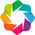

In [ ]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

!pip3 -q install autoviz
!pip3 -q install xlrd

from autoviz.AutoViz_Class import AutoViz_Class


In [ ]:
%matplotlib inline

In [ ]:
#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)

# pd.set_option('display.max_rows', 100) # if you wish to see more rows rather than default, just uncomment this line.
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import colorama
from colorama import Fore, Style  # maakes strings colored
# !pip3 install termcolor
from termcolor import colored

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
import io
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive/ColabNotebooks

# # Содержимое каталога
# ! ls
# Рабочая директория
! pwd

! ls
%cd /mydrive/ColabNotebooks/CirrhosisPrediction
! ls
! pwd

Mounted at /content/gdrive
 02.08-Sorting.ipynb
 Acute_Ischemia
 bb.ipynb
 chest-x-ray-medical-diagnosis-with-deep-learning.ipynb
 CirrhosisPrediction
'CNN_tuberculosis (1).ipynb'
 CNN_tuberculosis.ipynb
 CPP-1.ipynb
 Doc2Vec
 doc_tensor.w2v
 FR_Base
 GameObjectDetection-main.zip
'GameObjectDetection-main.zip (Unzipped Files)'
 Heart_Failure_Predict
 MediaPipeHandPose-main.zip
'MediaPipeHandPose-main.zip (Unzipped Files)'
 MediaPipePoseEstimation-main.zip
'MediaPipePoseEstimation-main.zip (Unzipped Files)'
 ML_3
 MoveNet
 movie_plots.csv
 nafld.json
 NeuronNet
 NLP
 ObjDetectTrack
 OvarianRes
 PhKopylov
 PubChem
 Python
 pytorch_objectdetecttrack-master.zip
 quickstart_tutorial.ipynb
 RNN_digit.ipynb
 saveWEUsedInDataOnly.ipynb
'semantic-search-with-sbert-main.zip (Unzipped Files)'
 semantic-similarity-with-bert.ipynb
 Tensorboard_visualizations.ipynb
 ThyroidUSound
 Transformers
 Untitled3.ipynb
 Vasileva_w2v_folic_and_pregnancy_ipynb_.ipynb
 WEB-Program
 Word2Vec
 word2vec2tensor.py


In [ ]:
df = pd.read_csv('cirrhosis.csv')
df.head()

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,1,400,D,D-penicillamine,21464,F,Y,Y,Y,Y,14.500,261.000,2.600,156.000,1718.000,137.950,172.000,190.000,12.200,4.000
1,2,4500,C,D-penicillamine,20617,F,N,Y,Y,N,1.100,302.000,4.140,54.000,7394.800,113.520,88.000,221.000,10.600,3.000
2,3,1012,D,D-penicillamine,25594,M,N,N,N,S,1.400,176.000,3.480,210.000,516.000,96.100,55.000,151.000,12.000,4.000
3,4,1925,D,D-penicillamine,19994,F,N,Y,Y,S,1.800,244.000,2.540,64.000,6121.800,60.630,92.000,183.000,10.300,4.000
4,5,1504,CL,Placebo,13918,F,N,Y,Y,N,3.400,279.000,3.530,143.000,671.000,113.150,72.000,136.000,10.900,3.000


In [ ]:
df['Age'] = df['Age']/365
df.sample(10)

,ID,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
239,240,1831,C,D-penicillamine,56.118,F,N,N,N,N,0.400,232.000,3.720,24.000,369.000,51.150,139.000,326.000,10.100,3.000
369,370,1095,D,NaN,50.036,F,NaN,NaN,NaN,N,16.000,NaN,3.360,NaN,NaN,NaN,NaN,384.000,10.000,3.000
100,101,3581,C,Placebo,44.981,F,N,N,N,N,0.900,400.000,3.600,31.000,1689.000,164.300,166.000,327.000,10.400,3.000
372,373,2103,C,NaN,62.044,F,NaN,NaN,NaN,N,0.700,NaN,3.290,NaN,NaN,NaN,NaN,190.000,9.800,2.000
246,247,732,CL,D-penicillamine,41.249,F,N,Y,N,N,6.100,1712.000,2.830,89.000,3681.000,158.100,139.000,297.000,10.000,3.000
336,337,2286,D,NaN,56.038,F,NaN,NaN,NaN,N,1.800,NaN,3.640,NaN,NaN,NaN,NaN,141.000,10.000,NaN
185,186,1576,D,D-penicillamine,70.885,F,N,N,Y,S,2.000,225.000,3.530,51.000,933.000,69.750,62.000,200.000,12.700,3.000
20,21,3445,C,Placebo,64.233,M,N,Y,Y,N,0.600,252.000,3.830,41.000,843.000,65.100,83.000,336.000,11.400,4.000
280,281,41,D,D-penicillamine,65.929,F,Y,N,N,Y,17.900,175.000,2.100,220.000,705.000,338.000,229.000,62.000,12.900,4.000
3,4,1925,D,D-penicillamine,54.778,F,N,Y,Y,S,1.800,244.000,2.540,64.000,6121.800,60.630,92.000,183.000,10.300,4.000


In [ ]:
df["Stage"].value_counts()

3.000    155
4.000    144
2.000     92
1.000     21
Name: Stage, dtype: int64

In [ ]:
!python -m pip uninstall matplotlib
!pip install matplotlib==3.1.3

Found existing installation: matplotlib 3.5.2
Uninstalling matplotlib-3.5.2:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.2-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.2.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 180, in _main
    status = self.run(options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/uninstall.py", line 86, in run
    auto_confirm=options.

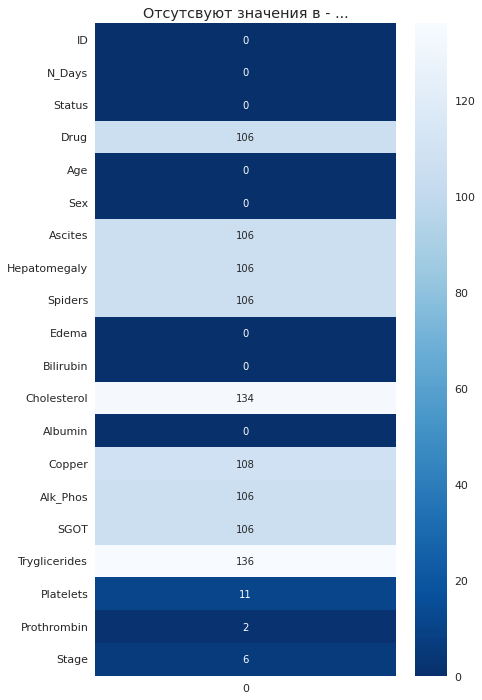

In [ ]:
plt.figure(figsize=(6, 12))
plt.title('Отсутсвуют значения в - ...')
ax = sns.heatmap(df.isna().sum().to_frame(), annot=True, fmt='d', cmap='Blues_r')
plt.show()

In [ ]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [ ]:
configure_plotly_browser_state()
df[['Age','Stage']].iplot(kind='hist', xTitle='Степень 1-4', 
                          
    barmode='overlay',
                  yTitle='Количество', title='Распределение больных по Степеням 1-4')
plt.show()

In [ ]:
df.nunique()

ID               418
N_Days           399
Status             3
Drug               2
Age              344
Sex                2
Ascites            2
Hepatomegaly       2
Spiders            2
Edema              3
Bilirubin         98
Cholesterol      201
Albumin          154
Copper           158
Alk_Phos         295
SGOT             179
Tryglicerides    146
Platelets        243
Prothrombin       48
Stage              4
dtype: int64

# <a id="1"></a>
<font color="lightseagreen" size=+2.5><b>2) Графические представления данных в датасете</b></font>

In [ ]:
df.describe()

,ID,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,418.000,418.000,418.000,418.000,284.000,418.000,310.000,312.000,312.000,282.000,407.000,416.000,412.000
mean,209.500,1917.782,50.776,3.221,369.511,3.497,97.648,1982.656,122.556,124.702,257.025,10.732,3.024
std,120.810,1104.673,10.454,4.408,231.945,0.425,85.614,2140.389,56.700,65.149,98.326,1.022,0.882
min,1.000,41.000,26.296,0.300,120.000,1.960,4.000,289.000,26.350,33.000,62.000,9.000,1.000
25%,105.250,1092.750,42.862,0.800,249.500,3.243,41.250,871.500,80.600,84.250,188.500,10.000,2.000
50%,209.500,1730.000,51.036,1.400,309.500,3.530,73.000,1259.000,114.700,108.000,251.000,10.600,3.000
75%,313.750,2613.500,58.281,3.400,400.000,3.770,123.000,1980.000,151.900,151.000,318.000,11.100,4.000
max,418.000,4795.000,78.493,28.000,1775.000,4.640,588.000,13862.400,457.250,598.000,721.000,18.000,4.000


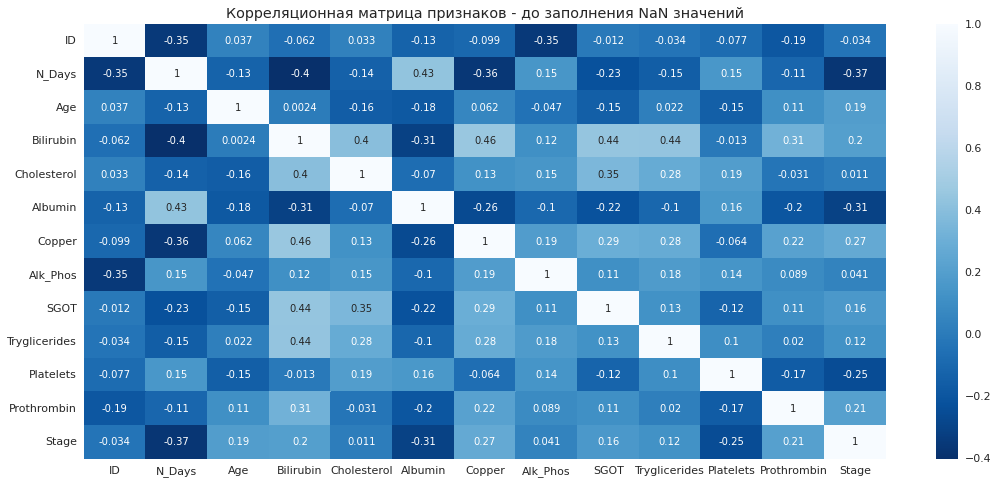

In [ ]:
plt.figure(figsize = (16,8))
ax = plt.axes()
sns.heatmap(df.corr(), annot = True, cmap='Blues_r', ax=ax)
ax.set_title('Корреляционная матрица признаков - до заполнения NaN значений',)
plt.show()

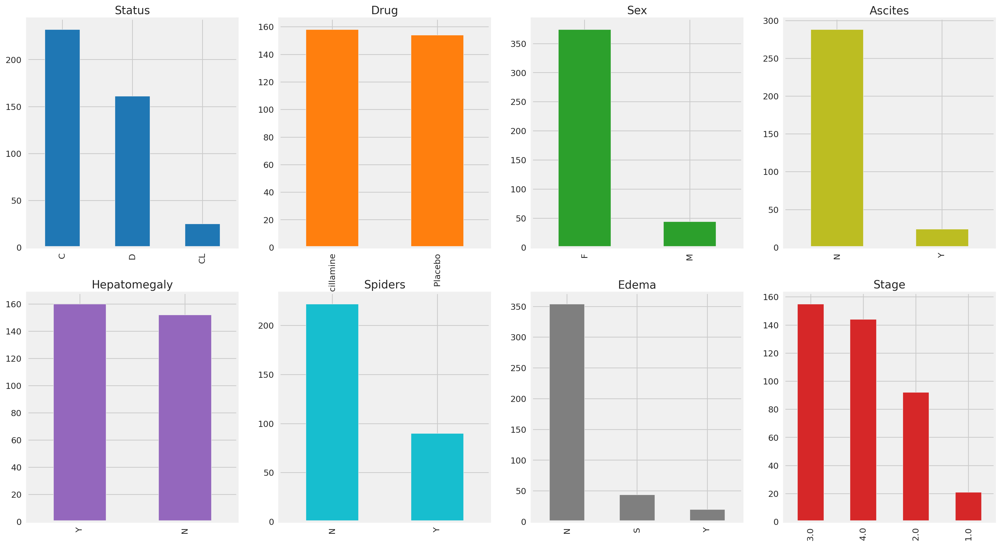

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=4, dpi=200, figsize=(20, 12))

df.Status.value_counts().plot(kind='bar', color='tab:blue', title='Status', ax=axes[0,0])
df.Drug.value_counts().plot(kind='bar', color='tab:orange', title='Drug', ax=axes[0,1])
df.Sex.value_counts().plot(kind='bar', color='tab:green', title='Sex', ax=axes[0,2])
df.Ascites.value_counts().plot(kind='bar', color='tab:olive', title='Ascites', ax=axes[0,3])

df.Hepatomegaly.value_counts().plot(kind='bar', color='tab:purple', title='Hepatomegaly', ax=axes[1,0])
df.Spiders.value_counts().plot(kind='bar', color='tab:cyan', title='Spiders', ax=axes[1,1])
df.Edema.value_counts().plot(kind='bar', color='tab:grey', title='Edema', ax=axes[1,2])
df.Stage.value_counts().plot(kind='bar', color='tab:red', title='Stage', ax=axes[1,3]);

In [ ]:
# делаем это из-за того что в датасете МНОГО ПРОПУЩЕННЫХ ЗНАЧЕНИЙ !!!
# -------------------------------------------------------------------------

# удаляем 6 строк с отсутсвующими данными по 'Stage'
df = df[df['Stage'].notna()]

# Числовые с NaN преобразовываемым по средним --> Median
numerical_columns = df.select_dtypes(include=(['int64', 'float64'])).columns

for c in numerical_columns:
    df[c].fillna(df[c].median(), inplace=True)
    
# Категориальные --> по наиболее часто встречающимися
categorical_columns = df.select_dtypes(include=('object')).columns

for c in categorical_columns:
    df[c].fillna(df[c].mode().values[0], inplace=True)

    
df.Stage = df.Stage.astype(int)

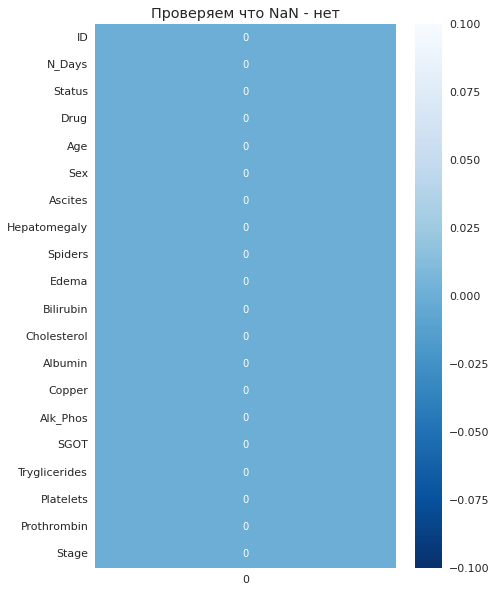

In [ ]:
plt.figure(figsize=(6, 10))
plt.title('Проверяем что NaN - нет')
ax = sns.heatmap(df.isna().sum().to_frame(), annot=True, fmt='d', cmap='Blues_r')
plt.show()

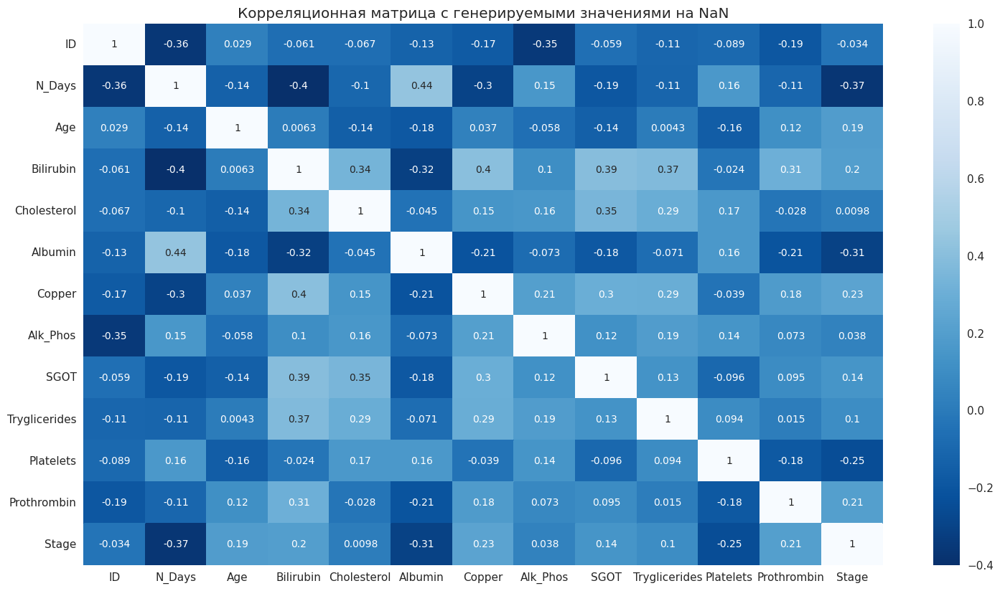

In [ ]:
plt.figure(figsize = (16,10), dpi=100)
ax = plt.axes()
sns.heatmap(df.corr(), annot = True, cmap='Blues_r', ax=ax)
ax.set_title('Корреляционная матрица с генерируемыми значениями на NaN')
plt.show()

### применяем AutoViz для визуализации зависимостей

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Shape of your Data Set loaded: (412, 20)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    20 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 55


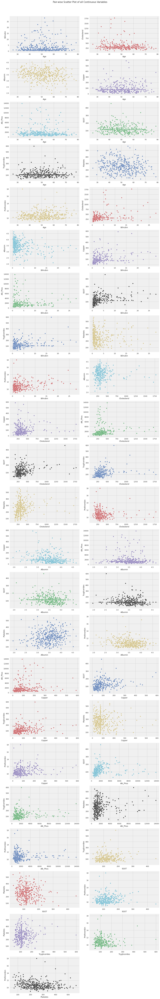

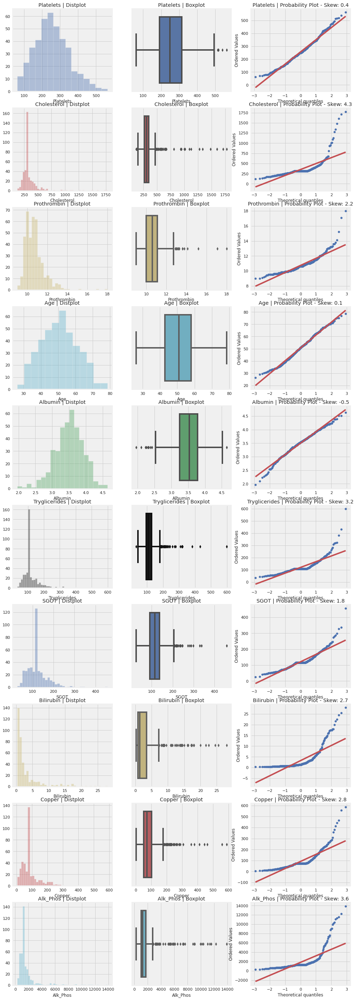

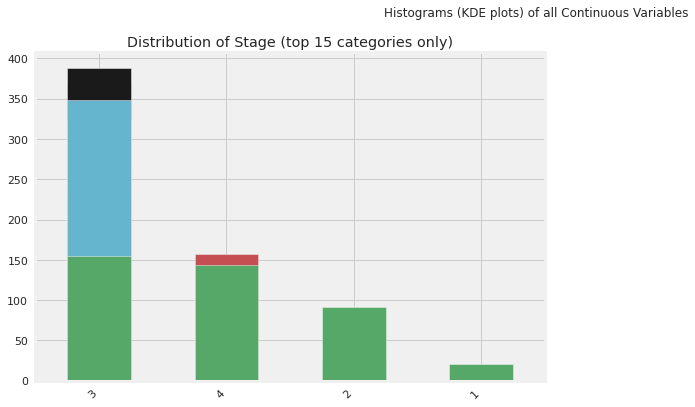

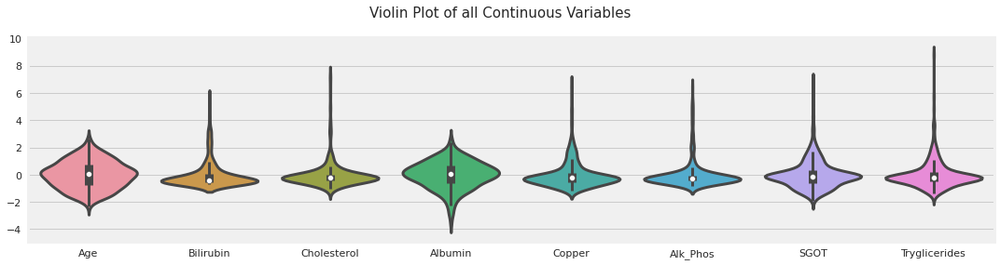

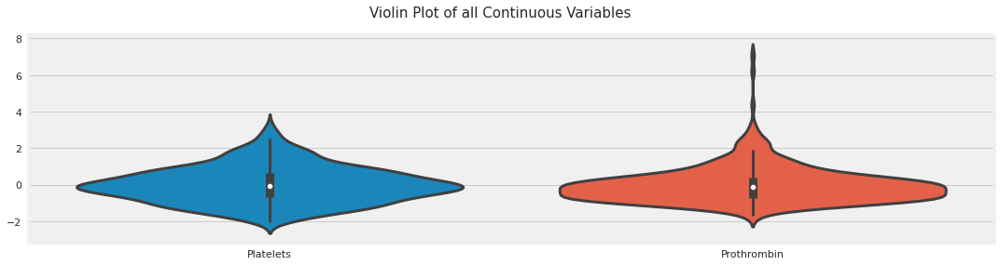

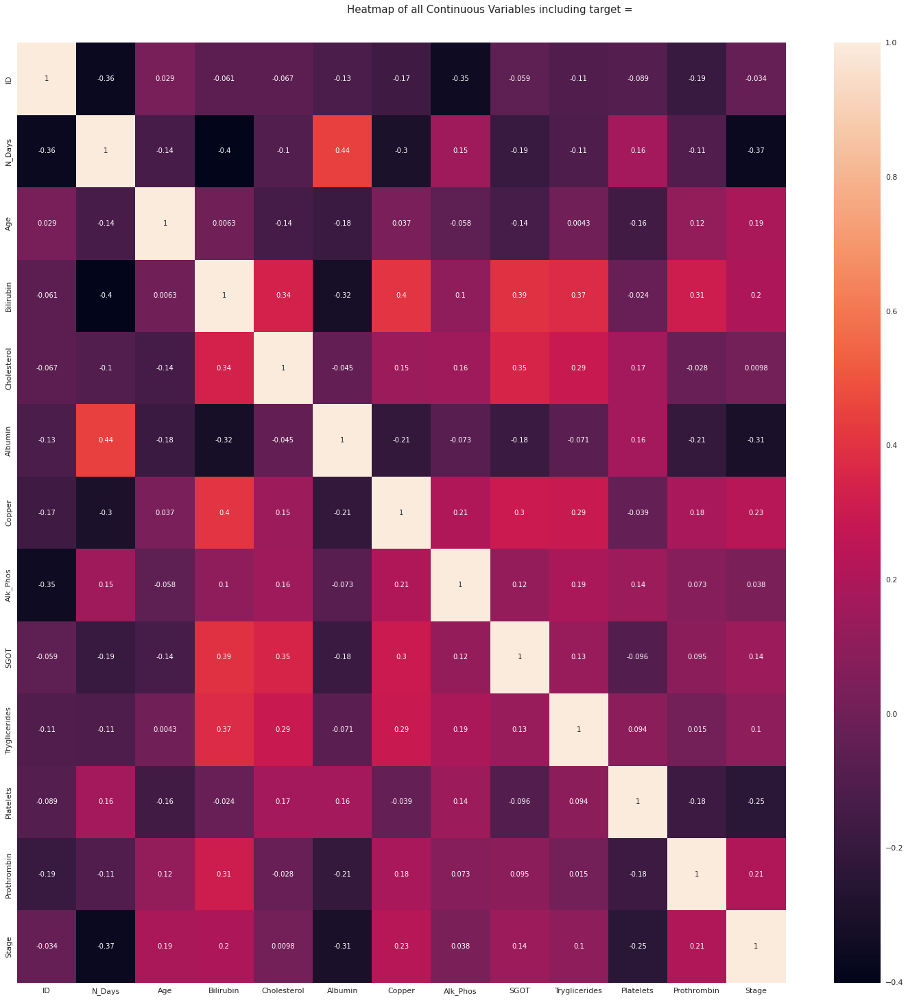

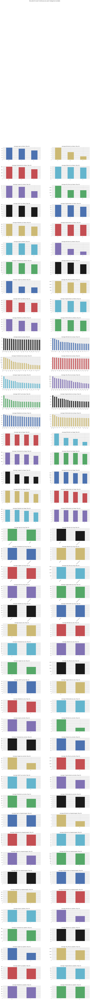

Time to run AutoViz = 40 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

### Предварительное изучение датасета

In [ ]:
# df = pd.read_csv('cirrhosis.csv')
df = df[df.columns[1:]]
df.head()

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,D,D-penicillamine,58.805,F,Y,Y,Y,Y,14.500,261.000,2.600,156.000,1718.000,137.950,172.000,190.000,12.200,4
1,4500,C,D-penicillamine,56.485,F,N,Y,Y,N,1.100,302.000,4.140,54.000,7394.800,113.520,88.000,221.000,10.600,3
2,1012,D,D-penicillamine,70.121,M,N,N,N,S,1.400,176.000,3.480,210.000,516.000,96.100,55.000,151.000,12.000,4
3,1925,D,D-penicillamine,54.778,F,N,Y,Y,S,1.800,244.000,2.540,64.000,6121.800,60.630,92.000,183.000,10.300,4
4,1504,CL,Placebo,38.132,F,N,Y,Y,N,3.400,279.000,3.530,143.000,671.000,113.150,72.000,136.000,10.900,3


In [ ]:
# Value_list = df['Stage'].unique()

# for x in range(len(Value_list)):
#     df.Stage[df['Stage'] == Value_list[x]] = x

# df.head()

In [ ]:
# Value_list = df['Sex'].unique()

# for x in range(len(Value_list)):
#     df.Sex[df['Sex'] == Value_list[x]] = x

# df.head()

In [ ]:
# df = df.fillna(0)
# df.head()

In [ ]:
df_copy = df.copy()

In [ ]:
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,D,D-penicillamine,58.805,F,Y,Y,Y,Y,14.500,261.000,2.600,156.000,1718.000,137.950,172.000,190.000,12.200,4
1,4500,C,D-penicillamine,56.485,F,N,Y,Y,N,1.100,302.000,4.140,54.000,7394.800,113.520,88.000,221.000,10.600,3
2,1012,D,D-penicillamine,70.121,M,N,N,N,S,1.400,176.000,3.480,210.000,516.000,96.100,55.000,151.000,12.000,4
3,1925,D,D-penicillamine,54.778,F,N,Y,Y,S,1.800,244.000,2.540,64.000,6121.800,60.630,92.000,183.000,10.300,4
4,1504,CL,Placebo,38.132,F,N,Y,Y,N,3.400,279.000,3.530,143.000,671.000,113.150,72.000,136.000,10.900,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,681,D,D-penicillamine,67.047,F,N,Y,N,N,1.200,309.500,2.960,73.000,1259.000,114.700,108.000,174.000,10.900,3
414,1103,C,D-penicillamine,39.027,F,N,Y,N,N,0.900,309.500,3.830,73.000,1259.000,114.700,108.000,180.000,11.200,4
415,1055,C,D-penicillamine,57.038,F,N,Y,N,N,1.600,309.500,3.420,73.000,1259.000,114.700,108.000,143.000,9.900,3
416,691,C,D-penicillamine,58.041,F,N,Y,N,N,0.800,309.500,3.750,73.000,1259.000,114.700,108.000,269.000,10.400,3


In [ ]:
df[['Bilirubin', 'Cholesterol',	'Albumin',	'Copper',	'Alk_Phos',	'SGOT',	'Tryglicerides',	'Platelets',	'Prothrombin',	'Stage']] = df[['Bilirubin',	'Cholesterol',	'Albumin',	'Copper',	'Alk_Phos',	'SGOT',	'Tryglicerides',	'Platelets',	'Prothrombin',	'Stage']].astype(int)

In [ ]:
column_list = ['Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']

for column in column_list:
    df = df.astype({column: "int"})
    Nmax = int(df[column].max())
    Nmin = int(df[ column].min())

    labels = []
    
    bin_lenght = max(df[column].max() , 2 )
    bin_lenght = min(df[column].max() - df[column].min() , 10)
    print(bin_lenght , column)

    for i in range(Nmin, Nmax, bin_lenght):
        labels.append(i)

    labels = labels[:-1]

    df_copy[column] = pd.cut(df[column], bins =  range(Nmin, Nmax , bin_lenght),  right=False, labels=labels)


10 Age
10 Bilirubin
10 Cholesterol
3 Albumin
10 Copper
10 Alk_Phos
10 Tryglicerides
10 Platelets
9 Prothrombin


In [ ]:
column_list = ['Age','N_Days']

for column in column_list:
    Nmax = int(df[column].max())
    Nmin = int(df[ column].min())

    labels = []
    
    #bin_lenght = max(df[column].max() , 2 )
    bin_lenght = min(df[column].max() - df[column].min() , 4)
    #print(bin_lenght , column)

    for i in range(Nmin, Nmax, bin_lenght):
        labels.append(i)

    labels = labels[:-1]

    df_copy[column] = pd.cut(df[column], bins =  range(Nmin, Nmax , bin_lenght),  right=False, labels=labels)

df_copy.head()

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,397,D,D-penicillamine,58,F,Y,Y,Y,Y,10,260,NaN,154,1709,137.950,163,182,NaN,4
1,4497,C,D-penicillamine,54,F,N,Y,Y,N,0,300,NaN,54,7389,113.520,83,212,NaN,3
2,1009,D,D-penicillamine,70,M,N,N,N,S,0,170,NaN,204,509,96.100,53,142,NaN,4
3,1925,D,D-penicillamine,54,F,N,Y,Y,S,0,240,NaN,64,6119,60.630,83,182,NaN,4
4,1501,CL,Placebo,38,F,N,Y,Y,N,0,270,NaN,134,669,113.150,63,132,NaN,3


In [ ]:
import plotly.express as px
#fig = px.parallel_categories(df)
configure_plotly_browser_state()
fig = px.parallel_categories(df, color="Age", 
                    color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)

fig.show()

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

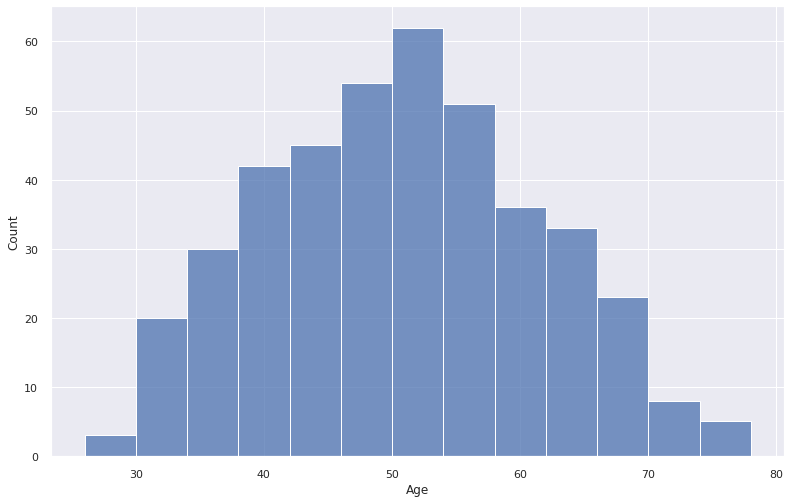

In [ ]:
sns.histplot(df['Age'])

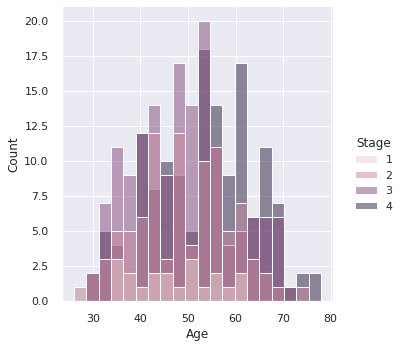

In [ ]:
sns.displot(data = df , x = 'Age',  bins=20, hue = 'Stage')

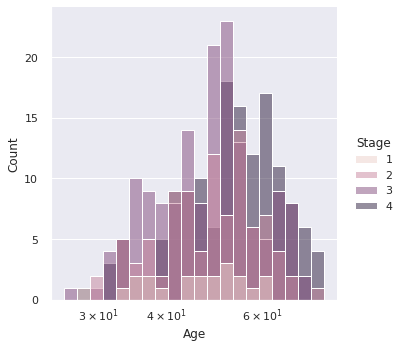

In [ ]:
sns.displot(data = df , x = 'Age',  bins=20, hue = 'Stage' , log_scale=True)

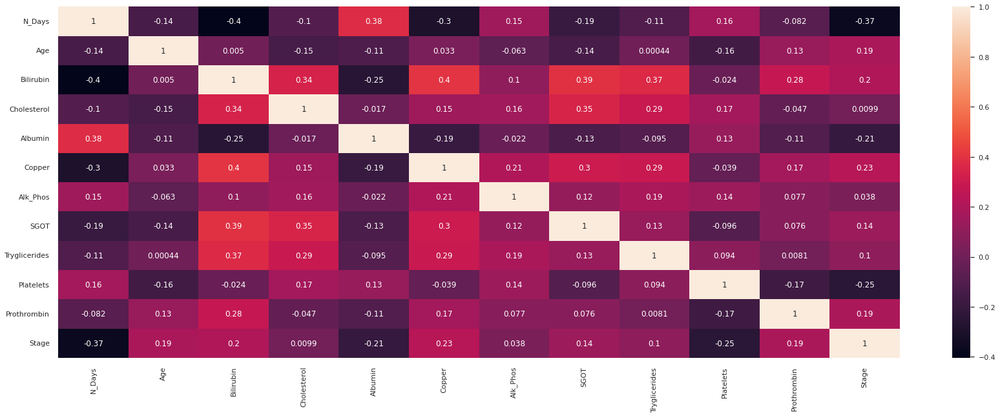

In [ ]:
plt.figure(figsize=(26, 10))
sns.heatmap(df.corr(), annot=True)
plt.xticks(rotation=90);

Каждая ячейка в матрице корреляции представляет собой «коэффициент корреляции» между двумя переменными, соответствующими строке и столбцу ячейки.

## A **Коэффициент корреляции** — это число, обозначающее силу связи между двумя переменными.

Существует несколько коэффициентов корреляции,

1. Коэффициент Пирсона (обозначается ρ (rho)) – чаще всего используется
Он определяется как ковариация между двумя переменными, деленная на произведение стандартных отклонений двух переменных.

## Формула для коэффициента корреляции между двумя переменными

Где ковариация между X и Y COV(X, Y) далее определяется как «ожидаемое значение произведения отклонений X и Y от их соответствующих средних значений».

- Значение ρ лежит между -1 и +1.
- Значения, близкие к +1, указывают на наличие сильной положительной связи между X и Y, тогда как значения, близкие к -1, указывают на сильную отрицательную связь между X и Y.
- Значения, близкие к нулю, означают отсутствие какой-либо связи между X и Y.




### По-видимому, не существует корреляции между признаками. 
       

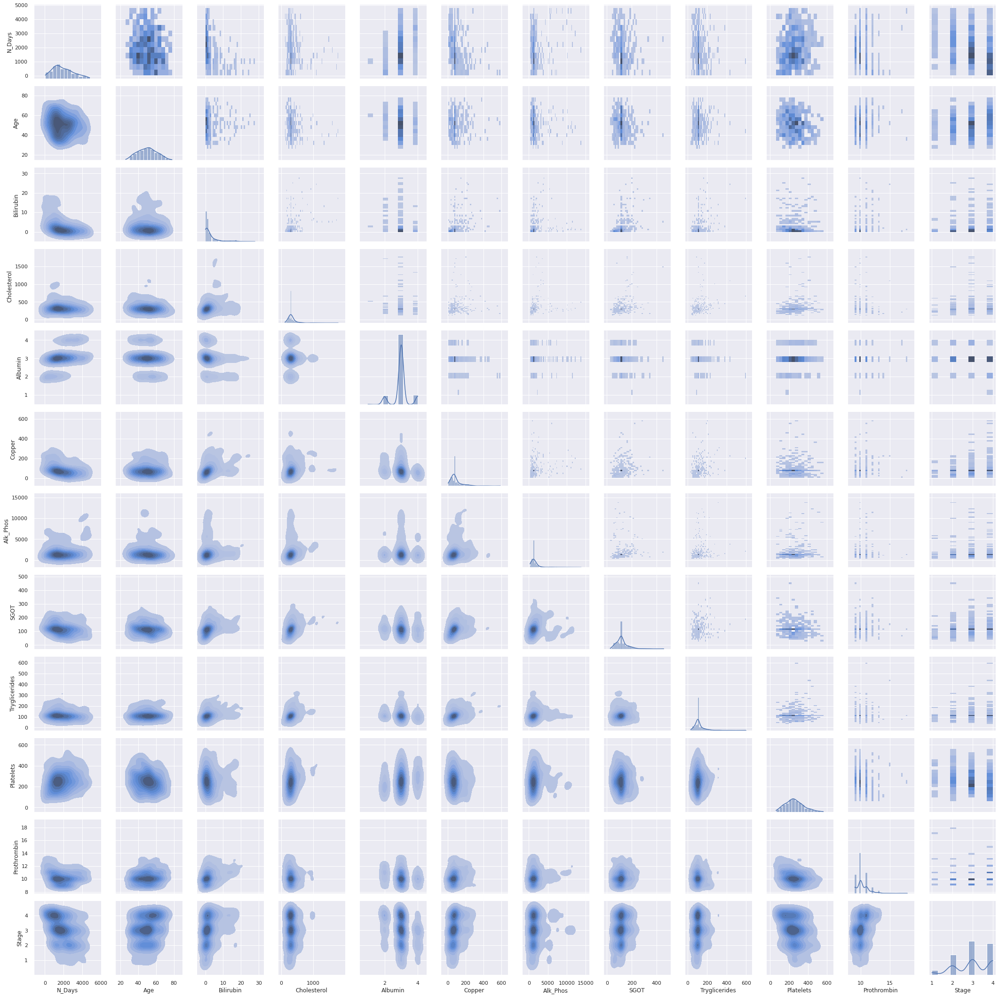

In [ ]:
configure_plotly_browser_state()
g = sns.PairGrid(df)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True)
g.map_diag(sns.histplot, kde=True)

## Некоторые распределения данных
 

In [ ]:
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,D,D-penicillamine,58,F,Y,Y,Y,Y,14,261,2,156,1718,137.950,172,190,12,4
1,4500,C,D-penicillamine,56,F,N,Y,Y,N,1,302,4,54,7394,113.520,88,221,10,3
2,1012,D,D-penicillamine,70,M,N,N,N,S,1,176,3,210,516,96.100,55,151,12,4
3,1925,D,D-penicillamine,54,F,N,Y,Y,S,1,244,2,64,6121,60.630,92,183,10,4
4,1504,CL,Placebo,38,F,N,Y,Y,N,3,279,3,143,671,113.150,72,136,10,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,681,D,D-penicillamine,67,F,N,Y,N,N,1,309,2,73,1259,114.700,108,174,10,3
414,1103,C,D-penicillamine,39,F,N,Y,N,N,0,309,3,73,1259,114.700,108,180,11,4
415,1055,C,D-penicillamine,57,F,N,Y,N,N,1,309,3,73,1259,114.700,108,143,9,3
416,691,C,D-penicillamine,58,F,N,Y,N,N,0,309,3,73,1259,114.700,108,269,10,3


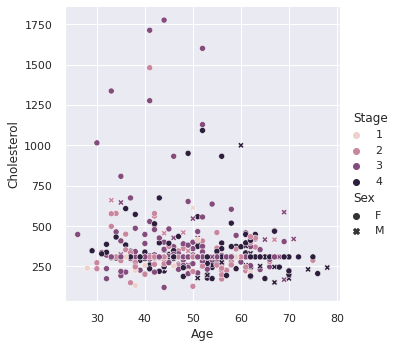

In [ ]:
sns.relplot(x="Age", y="Cholesterol", hue="Stage", style="Sex", data=df);

<Figure size 2160x1440 with 0 Axes>

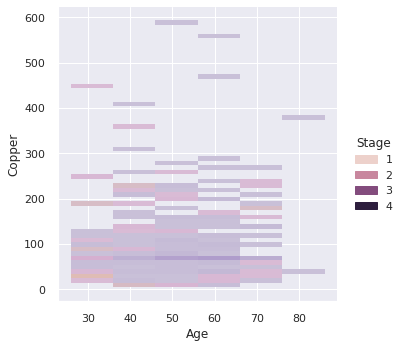

In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})

fig = plt.figure(figsize= (30,20))

sns.displot(data = df , x = 'Age', y = 'Copper' ,  hue = 'Stage' , binwidth=(10, 10))

<Figure size 1440x1440 with 0 Axes>

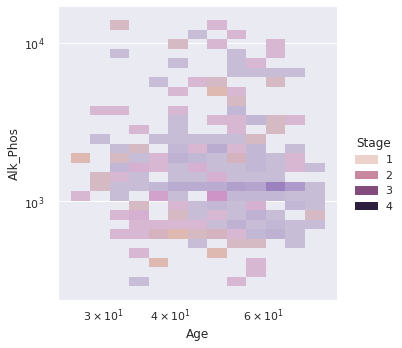

In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})

fig = plt.figure(figsize= (20,20))

sns.displot(data = df , x = 'Age', y = 'Alk_Phos' ,  hue = 'Stage' , log_scale=(True, True))

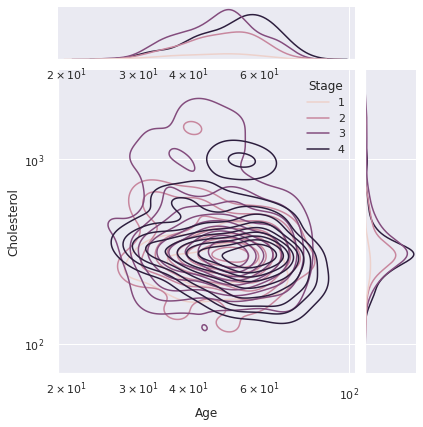

In [ ]:
sns.jointplot(data = df , x = 'Age', y = 'Cholesterol', hue="Stage" , kind = 'kde' , log_scale = True)

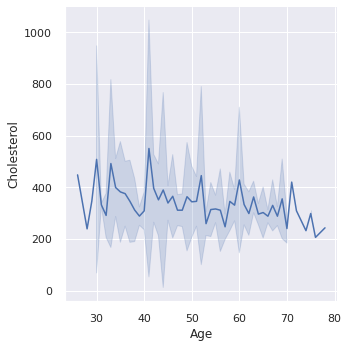

In [ ]:
sns.relplot(x="Age", y="Cholesterol", kind="line", ci="sd", data=df);

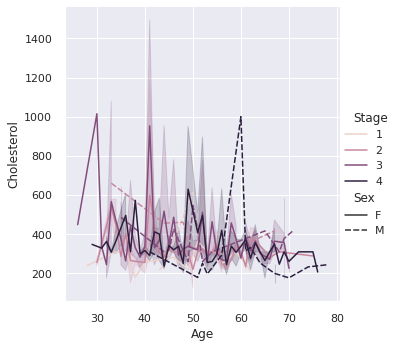

In [ ]:
sns.relplot(x="Age", y="Cholesterol",
            hue="Stage", style="Sex", kind="line", data=df);

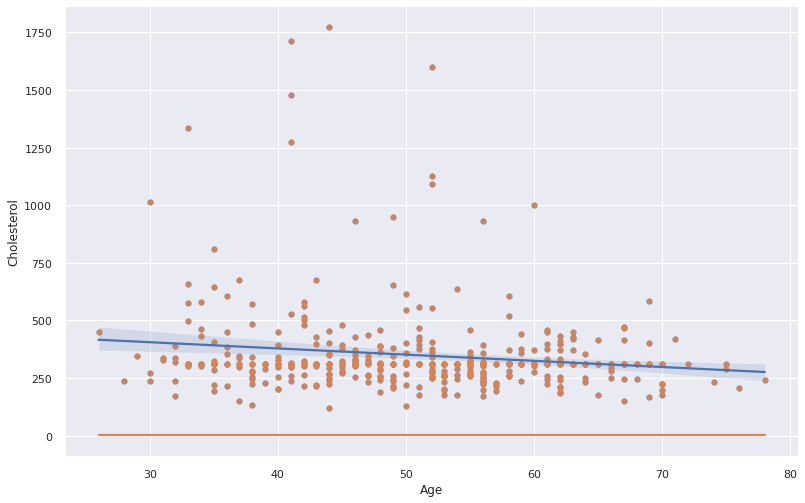

In [ ]:
sns.regplot(x="Age", y="Cholesterol", data=df );
sns.regplot(x="Age", y="Cholesterol", data=df ,logistic=True);

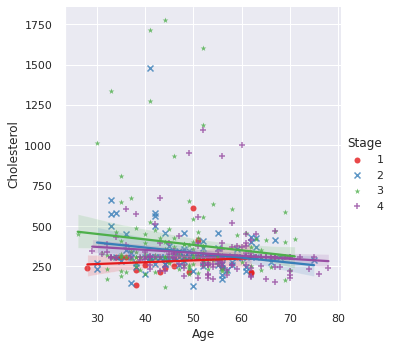

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

sns.lmplot(x="Age", y="Cholesterol", hue="Stage", data=df,
           markers=["o", "x" , '*' , '+'], palette="Set1" );

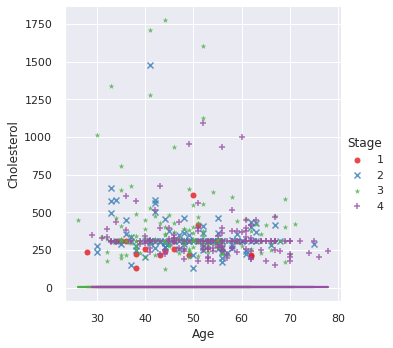

In [ ]:
sns.lmplot(x="Age", y="Cholesterol", hue="Stage", data=df,
           markers=["o", "x" , '*' , '+' ], palette="Set1" , logistic = True);

# ML 


In [ ]:
# Меняем категории на целые значения - что не совсем правильно!

df['Sex'] = df['Sex'].replace({'M':0, 'F':1})
df['Ascites'] = df['Ascites'].replace({'N':0, 'Y':1})
df['Drug'] = df['Drug'].replace({'D-penicillamine':0, 'Placebo':1})
df['Hepatomegaly'] = df['Hepatomegaly'].replace({'N':0, 'Y':1})
df['Spiders'] = df['Spiders'].replace({'N':0, 'Y':1})
df['Edema'] = df['Edema'].replace({'N':0, 'Y':1, 'S':-1})
df['Status'] = df['Status'].replace({'C':0, 'CL':1, 'D':-1})

In [ ]:
df

,N_Days,Status,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,400,-1,0,58,1,1,1,1,1,14,261,2,156,1718,137.950,172,190,12,4
1,4500,0,0,56,1,0,1,1,0,1,302,4,54,7394,113.520,88,221,10,3
2,1012,-1,0,70,0,0,0,0,-1,1,176,3,210,516,96.100,55,151,12,4
3,1925,-1,0,54,1,0,1,1,-1,1,244,2,64,6121,60.630,92,183,10,4
4,1504,1,1,38,1,0,1,1,0,3,279,3,143,671,113.150,72,136,10,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,681,-1,0,67,1,0,1,0,0,1,309,2,73,1259,114.700,108,174,10,3
414,1103,0,0,39,1,0,1,0,0,0,309,3,73,1259,114.700,108,180,11,4
415,1055,0,0,57,1,0,1,0,0,1,309,3,73,1259,114.700,108,143,9,3
416,691,0,0,58,1,0,1,0,0,0,309,3,73,1259,114.700,108,269,10,3


In [ ]:
X = df.drop(['Status', 'N_Days', 'Stage'], axis=1)
y = df.pop('Stage')

In [ ]:
# Upsamlping
from imblearn.over_sampling import SMOTE
sm = SMOTE(k_neighbors = 3)
X, y = sm.fit_resample(X, y)

In [ ]:
# Scaling Data
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, random_state = 401)

In [ ]:
# Функция для визуализации результатов используемых моделей обучения

def score_vis(score):
    
    names = ['SVM', 'Decision Tree', 'Random Forest', 'Logistic Regression', 'GradientBoostingClassifier','AdaBoost', 'KNN']

    plt.rcParams['figure.figsize']=20,8
    ax = sns.barplot(x=names, y=score, palette = "plasma", saturation =2.0)
    plt.xlabel('Model', fontsize = 20 )
    plt.ylabel('Accuracy(%)', fontsize = 20)
    plt.title('Model Comparison - Test set', fontsize = 20)
    plt.xticks(fontsize = 12, horizontalalignment = 'center', rotation = 8)
    plt.yticks(fontsize = 12)
    for i in ax.patches:
        width, height = i.get_width(), i.get_height()
        x, y = i.get_xy() 
        ax.annotate(f'{round(height,2)}%', (x + width/2, y + height*1.02), ha='center', fontsize = 'x-large')
    plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
def trainer(X_train, y_train, X_test, y_test):
    
    models= [[' SVM ',SVC()],
             [' Decision Tree ', DecisionTreeClassifier()],
             [' Random Forest ', RandomForestClassifier()],
             [' Logistic Regression ', LogisticRegression(max_iter=200)],
             [ 'GradientBoostingClassifier', GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,max_depth=1, random_state=0)],
             [' AdaBoost ', AdaBoostClassifier()],
             [' KNN ', KNeighborsClassifier()]]

    scores = []
    
    for model_name, model in models:

        model = model
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        cm_model = confusion_matrix(y_test, pred)
        scores.append(accuracy_score(y_test, model.predict(X_test)))
        

        print(Back.YELLOW + Fore.BLACK + Style.BRIGHT + model_name)
        print(Back.RESET)
        print(cm_model)
        print('\n' + Fore.BLUE + 'Training Acc.  : ' + Fore.GREEN + str(round(accuracy_score(y_train, model.predict(X_train)) * 100, 2)) + '%' )
        print(Fore.BLUE + 'Validation Acc.: ' + Fore.GREEN + str(round(accuracy_score(y_test, model.predict(X_test)) * 100, 2)) + '%' )
        print(Fore.CYAN + classification_report(y_test, pred)) 
        
        visualizer = ROCAUC(model)
        visualizer.fit(X_train, y_train)
        visualizer.score(X_test, y_test)
        visualizer.show()   

        print('\n' + Fore.BLACK + Back.WHITE + '----------------------------------------------------------------------------------\n')
    
        
    return scores

In [ ]:
from colorama import Fore, Back, Style
from yellowbrick.classifier import ROCAUC

# **Результаты**

 SVM 

[[29  2  0  0]
 [ 4 12  2  1]
 [ 2  5 11  1]
 [ 3  6  4 11]]

Training Acc.  : 73.06%
Validation Acc.: 67.74%
              precision    recall  f1-score   support

           1       0.76      0.94      0.84        31
           2       0.48      0.63      0.55        19
           3       0.65      0.58      0.61        19
           4       0.85      0.46      0.59        24

    accuracy                           0.68        93
   macro avg       0.68      0.65      0.65        93
weighted avg       0.70      0.68      0.67        93



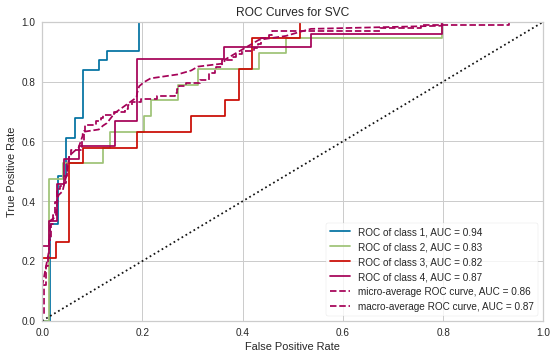


----------------------------------------------------------------------------------

 Decision Tree 

[[26  1  4  0]
 [ 2 12  3  2]
 [ 3  9  7  0]
 [ 1  8  4 11]]

Training Acc.  : 100.0%
Validation Acc.: 60.22%
              precision    recall  f1-score   support

           1       0.81      0.84      0.83        31
           2       0.40      0.63      0.49        19
           3       0.39      0.37      0.38        19
           4       0.85      0.46      0.59        24

    accuracy                           0.60        93
   macro avg       0.61      0.57      0.57        93
weighted avg       0.65      0.60      0.61        93



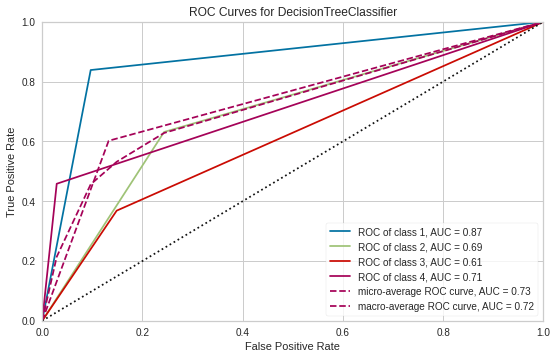


----------------------------------------------------------------------------------

 Random Forest 

[[31  0  0  0]
 [ 3 15  1  0]
 [ 2  4 11  2]
 [ 2  2  6 14]]

Training Acc.  : 100.0%
Validation Acc.: 76.34%
              precision    recall  f1-score   support

           1       0.82      1.00      0.90        31
           2       0.71      0.79      0.75        19
           3       0.61      0.58      0.59        19
           4       0.88      0.58      0.70        24

    accuracy                           0.76        93
   macro avg       0.75      0.74      0.74        93
weighted avg       0.77      0.76      0.75        93



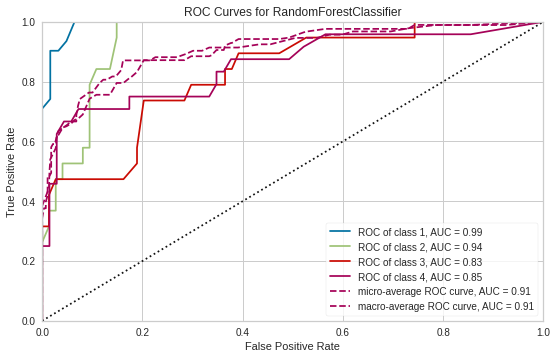


----------------------------------------------------------------------------------

 Logistic Regression 

[[24  7  0  0]
 [ 5  9  5  0]
 [ 3  5  8  3]
 [ 4  2  5 13]]

Training Acc.  : 56.74%
Validation Acc.: 58.06%
              precision    recall  f1-score   support

           1       0.67      0.77      0.72        31
           2       0.39      0.47      0.43        19
           3       0.44      0.42      0.43        19
           4       0.81      0.54      0.65        24

    accuracy                           0.58        93
   macro avg       0.58      0.55      0.56        93
weighted avg       0.60      0.58      0.58        93



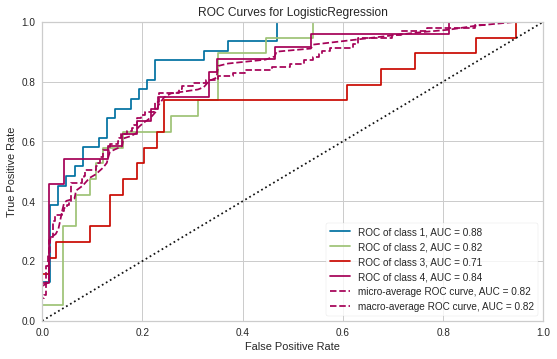


----------------------------------------------------------------------------------

GradientBoostingClassifier

[[24  4  3  0]
 [ 3 11  4  1]
 [ 2  2 13  2]
 [ 1  3 10 10]]

Training Acc.  : 88.8%
Validation Acc.: 62.37%
              precision    recall  f1-score   support

           1       0.80      0.77      0.79        31
           2       0.55      0.58      0.56        19
           3       0.43      0.68      0.53        19
           4       0.77      0.42      0.54        24

    accuracy                           0.62        93
   macro avg       0.64      0.61      0.61        93
weighted avg       0.67      0.62      0.63        93



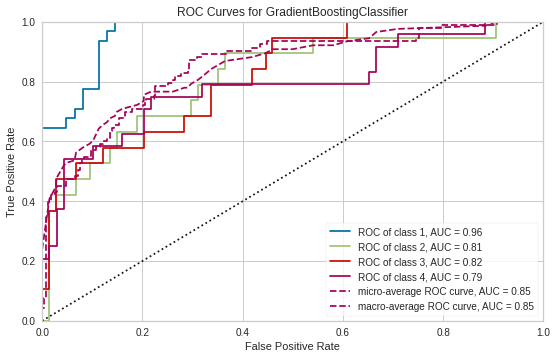


----------------------------------------------------------------------------------

 AdaBoost 

[[16 15  0  0]
 [ 3  7  8  1]
 [ 5  2  8  4]
 [ 2  4  9  9]]

Training Acc.  : 57.12%
Validation Acc.: 43.01%
              precision    recall  f1-score   support

           1       0.62      0.52      0.56        31
           2       0.25      0.37      0.30        19
           3       0.32      0.42      0.36        19
           4       0.64      0.38      0.47        24

    accuracy                           0.43        93
   macro avg       0.46      0.42      0.42        93
weighted avg       0.49      0.43      0.44        93



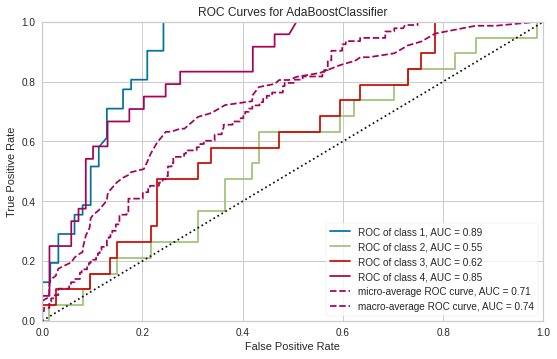


----------------------------------------------------------------------------------

 KNN 

[[29  2  0  0]
 [ 4 11  3  1]
 [ 3  6  8  2]
 [ 2 10  4  8]]

Training Acc.  : 72.49%
Validation Acc.: 60.22%
              precision    recall  f1-score   support

           1       0.76      0.94      0.84        31
           2       0.38      0.58      0.46        19
           3       0.53      0.42      0.47        19
           4       0.73      0.33      0.46        24

    accuracy                           0.60        93
   macro avg       0.60      0.57      0.56        93
weighted avg       0.63      0.60      0.59        93



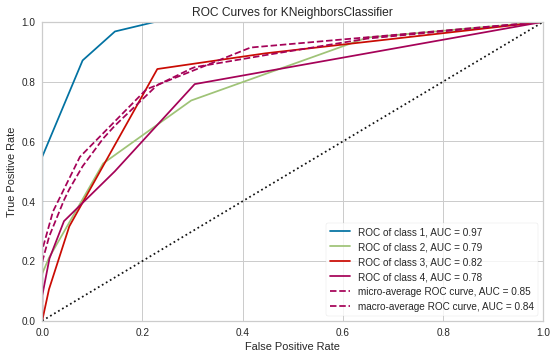


----------------------------------------------------------------------------------



In [ ]:

scores = trainer(X_train, y_train, X_test, y_test)

# **Выводы**

В нашем пилотном исследовании провели обучение моделей различных архитектур для предиктивной классификации пациентов по рискам развития степени цирроза. 

Результаты обучения показали, что такое обучение обеспечивает приемлемую прогнозную точность на уровне 94% для 1-2 классов, не требующих проведения биопсии, и 84-86% с высоким риском развития цирроза 3-4 класс. 

Таким образом, предложенные модели могут рассматриваться как основа для разработки программного обеспечения с перспективой применения в реальной клинической практике.

С этой целью мы планируем дальнейшее обучение моделей на расширенных наборах данных, выбор архитектуры обеспечивающей наилучшее качество и её применение в клинической практике.


